In [1]:
import pandas as pd

In [2]:
df = pd.read_parquet(r"D:\Repositories\kanta\cluster-faces\face_clusters.parquet")

In [3]:
df

,image_path,cluster
0,D:\Repositories\encode-faces\data\cristiano_ro...,0
1,D:\Repositories\encode-faces\data\cristiano_ro...,-1
2,D:\Repositories\encode-faces\data\cristiano_ro...,0
3,D:\Repositories\encode-faces\data\cristiano_ro...,0
4,D:\Repositories\encode-faces\data\cristiano_ro...,0
...,...,...
123,D:\Repositories\encode-faces\data\neymar\00000...,3
124,D:\Repositories\encode-faces\data\neymar\00000...,3
125,D:\Repositories\encode-faces\data\neymar\00000...,3
126,D:\Repositories\encode-faces\data\neymar\00000...,3


In [4]:
print(df.head())

                                          image_path  cluster
0  D:\Repositories\encode-faces\data\cristiano_ro...        0
1  D:\Repositories\encode-faces\data\cristiano_ro...       -1
2  D:\Repositories\encode-faces\data\cristiano_ro...        0
3  D:\Repositories\encode-faces\data\cristiano_ro...        0
4  D:\Repositories\encode-faces\data\cristiano_ro...        0


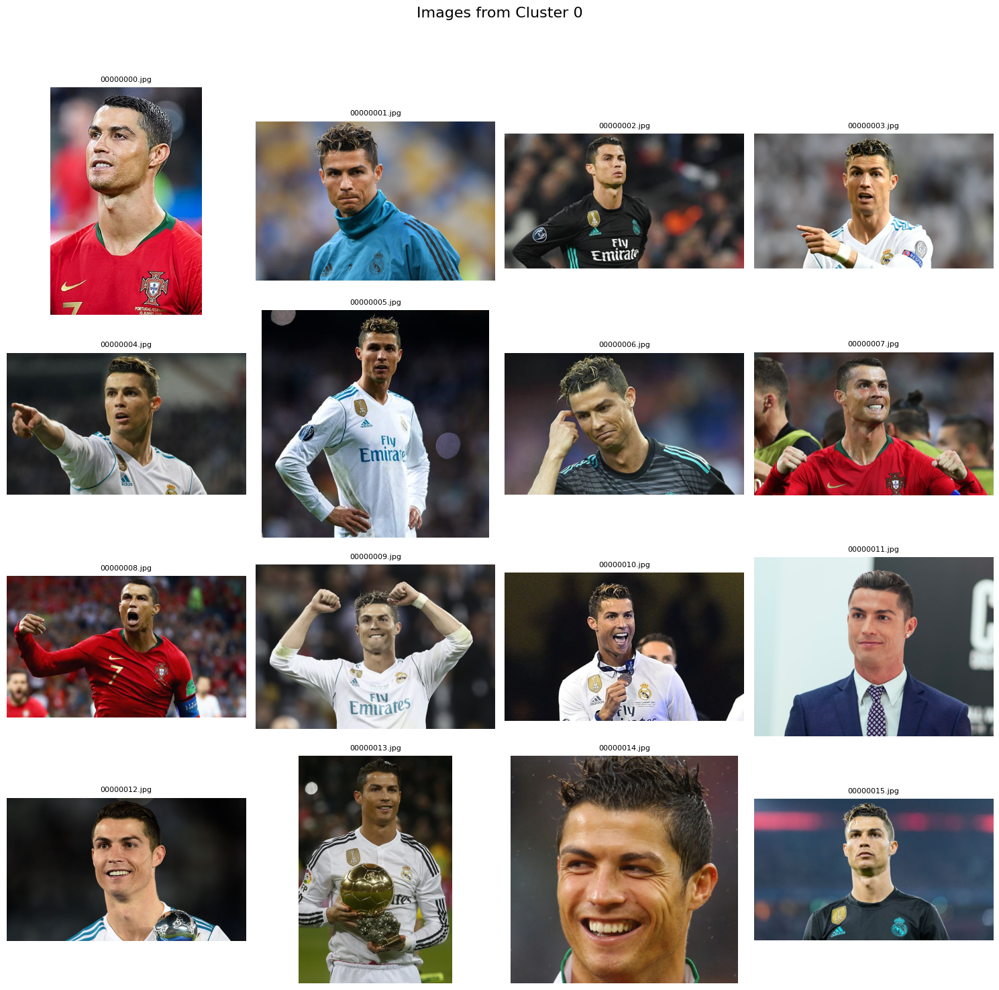

In [5]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np

def display_cluster_images(df, cluster_id, grid_size=(4, 4), figsize=(15, 15)):
    """
    Display images from a specific cluster in a grid layout
    
    Parameters:
    -----------
    df: pandas DataFrame with image_path and cluster columns
    cluster_id: int, the cluster ID to visualize
    grid_size: tuple, the dimensions of the grid (rows, cols)
    figsize: tuple, figure size in inches
    """
    # Filter dataframe for the specified cluster
    cluster_df = df[df['cluster'] == cluster_id]
    
    # Get up to grid_size[0] * grid_size[1] images
    max_images = grid_size[0] * grid_size[1]
    img_paths = cluster_df['image_path'].values[:max_images]
    
    # Create a figure with subplots
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=figsize)
    fig.suptitle(f'Images from Cluster {cluster_id}', fontsize=16)
    
    # Flatten the axes array for easier indexing
    axes = axes.flatten()
    
    # Loop through the image paths and display each image
    for i, img_path in enumerate(img_paths):
        if i < len(axes):
            try:
                # Check if file exists
                if os.path.exists(img_path):
                    # Open and convert the image
                    img = Image.open(img_path)
                    # Display the image
                    axes[i].imshow(np.array(img))
                    axes[i].set_title(os.path.basename(img_path), fontsize=8)
                    axes[i].axis('off')
                else:
                    axes[i].text(0.5, 0.5, f"File not found:\n{os.path.basename(img_path)}", 
                              ha='center', va='center', fontsize=8)
                    axes[i].axis('off')
            except Exception as e:
                axes[i].text(0.5, 0.5, f"Error loading image:\n{str(e)}", 
                          ha='center', va='center', fontsize=8)
                axes[i].axis('off')
    
    # Hide any unused subplots
    for i in range(len(img_paths), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust to make room for the title
    plt.show()

# Example usage: Display images from cluster 0
display_cluster_images(df, cluster_id=0)

# To view outliers or another cluster:
# display_cluster_images(df, cluster_id=-1)  # For outliers (cluster -1)

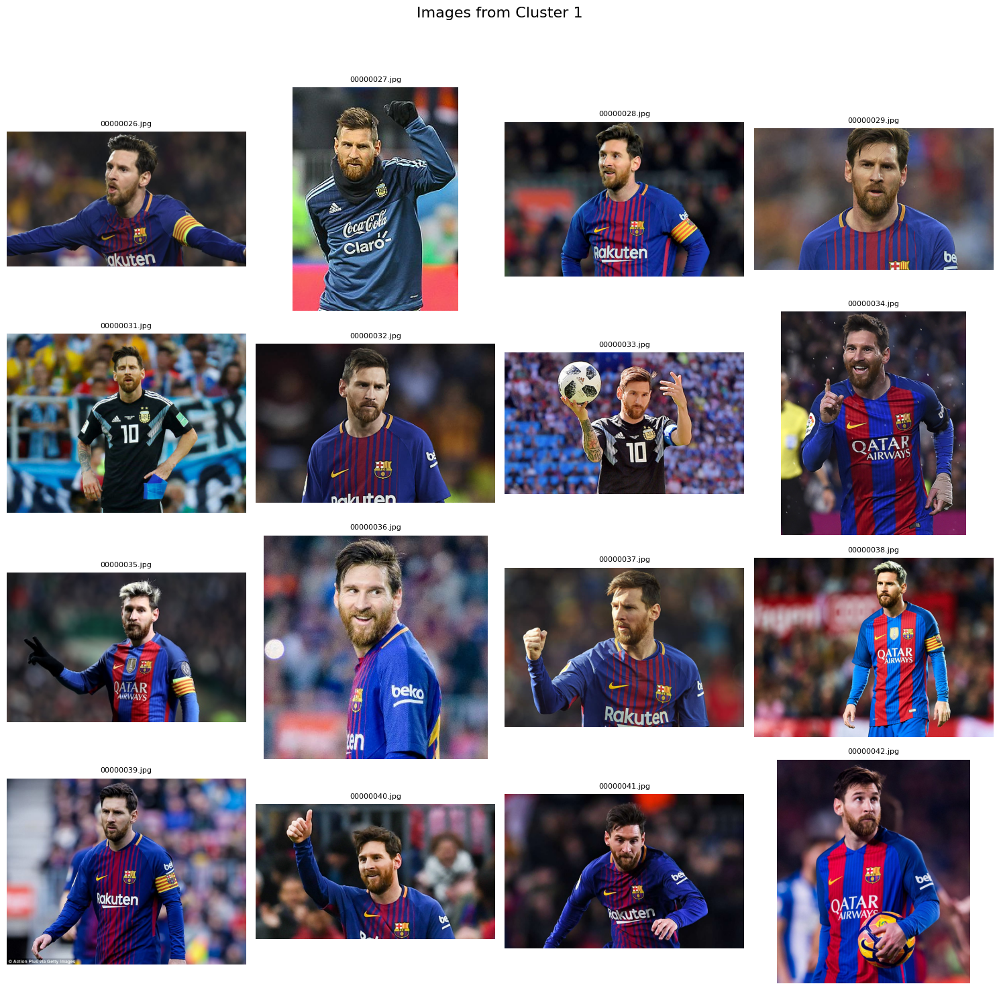

In [8]:
display_cluster_images(df, cluster_id=1)

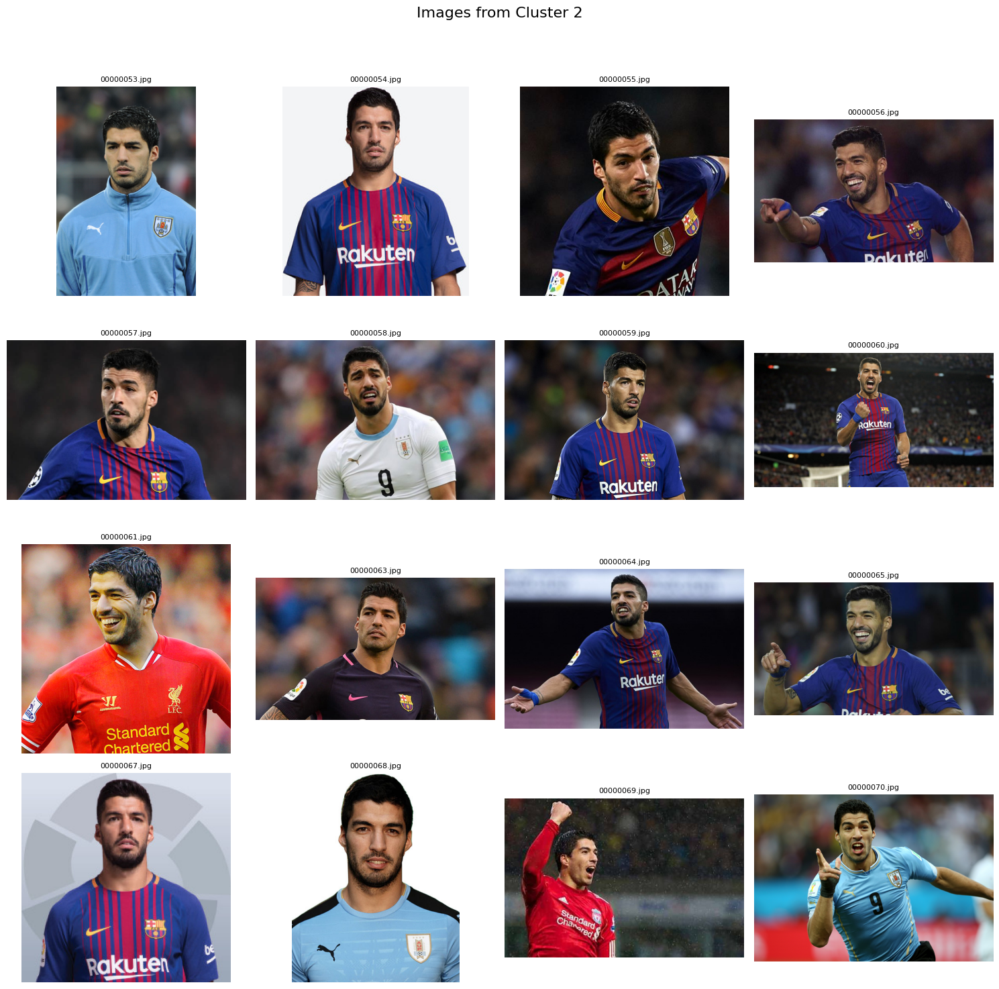

In [10]:
display_cluster_images(df, cluster_id=2)

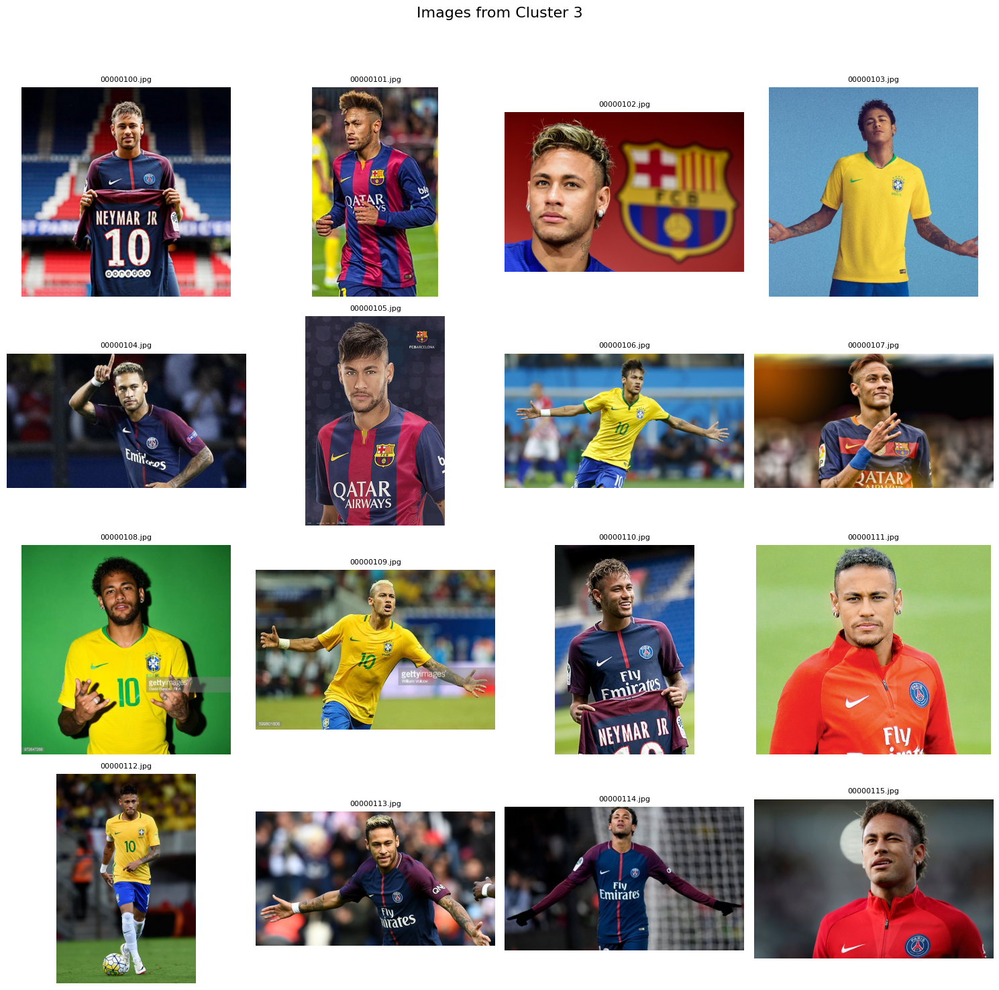

In [11]:
display_cluster_images(df, cluster_id=3)